## EM algorithm



In [4]:
using LinearAlgebra
using Plots
using Random
using Distributions

In [9]:
## Target distribution
GM = MixtureModel(MvNormal, [([6., 0.],[1. 0.5;0.5 1.]), ([1.,4.],[1. 1.;1. 2.])], [0.25, 0.75]);
data = rand(GM, 1000);

In [15]:
[1 0.5;0.5 1]

2×2 Array{Float64,2}:
 1.0  0.5
 0.5  1.0

In [12]:
[6, 0]

2-element Array{Int64,1}:
 6
 0

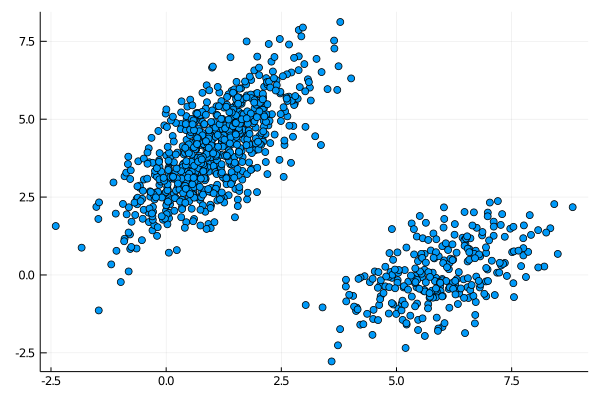

In [8]:
plot(data[1,:], data[2,:], seriestype=:scatter, leg=false)

In [392]:
N = size(data,2);
K = 2;

mu1  = [6.,0.]; sig1 = [1. 0.5;0.5 1.];
mu2  = [1.,4.]; sig2 = [1. 1.;1. 2.];
π1 = 0.25;

n_iter = 20;
μ1_all = zeros(2,n_iter);   μ2_all = zeros(2,n_iter);
Σ1_all = zeros(2,2,n_iter); Σ2_all = zeros(2,2,n_iter);

μ1_0 = [0.,0.]; μ2_0 = [4.,5.];
Σ1_0 = [1. 0.;0. 1.]; Σ2_0 = [1. 0.;0. 1.];

μ1_all[:,1] = μ1_0; μ2_all[:,1] = μ2_0;
Σ1_all[:,:,1] = Σ1_0; Σ2_all[:,:,1] = Σ2_0;

g2d(x,mu,sig) = (1/(2pi))* det(sig)^(-1/2)*exp( (-1/2)*(x-mu)'*inv(sig)*(x-mu) );
gm(x,m1,s1,m2,s2) = π1 * g2d(x,m1,s1) + (1-π1) * g2d(x,m2,s2);

# posterior distribution of hidden variable
γz = zeros(K,N);

Π = reshape(append!([1/2;1/2], zeros(2,n_iter-1)),(2,n_iter));
for l in 2:n_iter
    # E step
    for n in 1:N
        p_joint1 = Π[1,l-1] * g2d(data[:,n], μ1_all[:,l-1], Σ1_all[:,:,l-1]);
        p_joint2 = Π[2,l-1] * g2d(data[:,n], μ2_all[:,l-1], Σ2_all[:,:,l-1]);
        γz[:,n] = [p_joint1,p_joint2]./(p_joint1 + p_joint2);
    end

    # M step
    N_12 = sum(γz, dims=2);
    Π[:,l] = N_12/N;
    μ1_all[:,l] = sum( [γz[1,:]';γz[1,:]'] .* data, dims=2) / N_12[1];
    μ2_all[:,l] = sum( [γz[2,:]';γz[2,:]'] .* data, dims=2) / N_12[2];
    
    tmp_Σ1 = zeros(2,2,N); tmp_Σ2 = zeros(2,2,N);
    for n in 1:N
        tmp_Σ1[:,:,n] = γz[1,n] * (data[:,n]-μ1_all[:,l]) * (data[:,n]-μ1_all[:,l])';
        tmp_Σ2[:,:,n] = γz[2,n] * (data[:,n]-μ2_all[:,l]) * (data[:,n]-μ2_all[:,l])';
    end
    Σ1_all[:,:,l] = sum(tmp_Σ1,dims=3) / N_12[1];
    Σ2_all[:,:,l] = sum(tmp_Σ2,dims=3) / N_12[2];
end
    
μ1_ML = μ1_all[:,end]; μ2_ML = μ2_all[:,end];
Σ1_ML = Σ1_all[:,:,end]; Σ2_ML = Σ2_all[:,:,end];

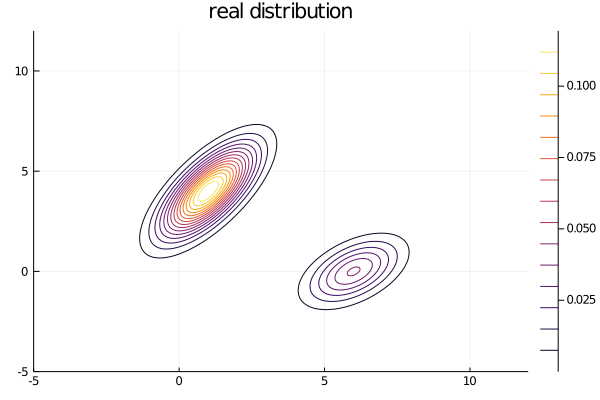

In [406]:
function gm2v(x,y)
    z = [x,y];
    return gm(z,mu1,sig1,mu2,sig2)
end

ran = collect(-5.:0.1:12.);
contour(ran, ran, gm2v, title="real distribution",)
#plot!(data[1,:], data[2,:], seriestype=:scatter, leg=false)

┌ Info: Saved animation to 
│   fn = /Users/kamiyashunsuke/Desktop/machine_learning/EM1.gif
└ @ Plots /Users/kamiyashunsuke/.julia/packages/Plots/JKY3H/src/animation.jl:104


Plots.AnimatedGif("/Users/kamiyashunsuke/Desktop/machine_learning/EM1.gif")
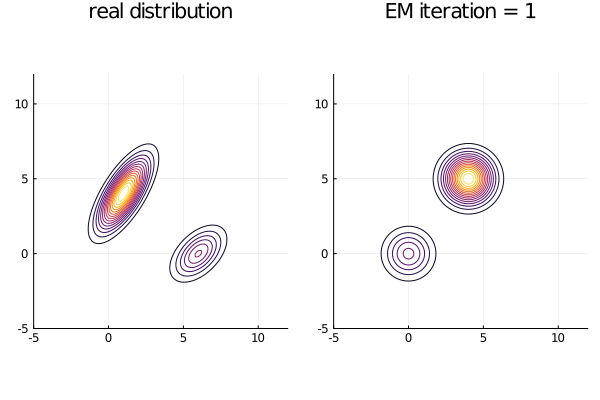

In [413]:
function gm2v(x,y,m1,s1,m2,s2)
    z = [x,y];
    return gm(z,m1,s1,m2,s2)
end

anim = Animation()
for ii in 1:n_iter
    plt1 = contour(ran, ran, gm2v, 
        title="real distribution",
        xlims = (-5,12),
        ylims = (-5,12),
        colorbar=false,
        aspect_ratio=:equal);
    plt2 = contour(ran, ran, (x,y)->gm2v(x,y,μ1_all[:,ii],Σ1_all[:,:,ii],μ2_all[:,ii],Σ2_all[:,:,ii]), 
        title="EM iteration = $ii",
        xlims = (-5,12),
        ylims = (-5,12),
        colorbar=false,
        aspect_ratio=:equal
        )
    contplt = plot(plt1,plt2, layout=(1,2), leg=false);
    frame(anim, contplt)
end
gif(anim, "EM1.gif", fps = 1)

In [396]:
# plot KL divergence decrease
using HCubature
DKL_gm_integrand(x,y,m1,s1,m2,s2) = gm2v(x,y,m1,s1,m2,s2) * log( gm2v(x,y,m1,s1,m2,s2)/gm2v(x,y,mu1,sig1,mu2,sig2) );
DKL_values = zeros(n_iter);

for l in 1:n_iter
    DKL_values[l]=  hcubature(x -> DKL_gm_integrand(x[1],x[2],μ1_all[:,l],Σ1_all[:,:,l],μ2_all[:,l],Σ2_all[:,:,l]), [-10.,-10.], [10., 10.])[1];
end


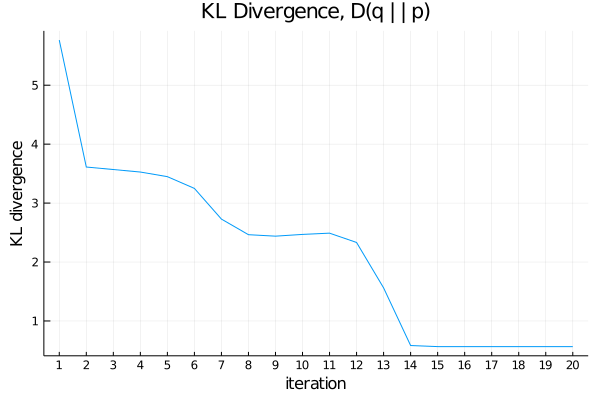

In [402]:
plot(1:n_iter,DKL_values,leg=false,
    xlabel = "iteration",
    xticks = 0:1:20,
    ylabel = "KL divergence",
    title="KL Divergence, D(q | | p)")

## Markov chain monte carlo

In [54]:
## Metropolis method

# Set pdf to be sampled
mu1  = [6.,0.]; sig1 = [1. 0.5;0.5 1.];
mu2  = [1.,4.]; sig2 = [1. 1.;1. 2.];
p = 0.25;
g2d_unnorm(x,mu,sig) = det(sig)^(-1/2)*exp( (-1/2)*(x-mu)'*inv(sig)*(x-mu) );
pdf_sampled(x) = p * g2d_unnorm(x,mu1,sig1) + (1-p) * g2d_unnorm(x,mu2,sig2);

# setting MC parameters
n_iter = 50000;
step_size = 1.0;
n_burnin = 5000;

# implement MC
rng = MersenneTwister(1234);
w0 = randn(rng, Float64, 2);
w_samples = zeros(n_iter,2);
w_samples[1,:] = w0;
n_accept = 0;

for n in 2:n_iter
    w_cand = w_samples[n-1,:] + step_size * randn(Float64,2);
    r_criteria = rand(Float64);
    ratio = pdf_sampled(w_cand)/pdf_sampled(w_samples[n-1,:]);
    if ratio > r_criteria
        w_samples[n,:] = w_cand;
        n_accept += 1;
    else
        w_samples[n,:] = w_samples[n-1,:]
    end
end

w_samples = w_samples[n_burnin+1:end,:];
plot(w_samples[:,1],w_samples[:,2],seriestype=:scatter,leg=false)
    



In [55]:
n_accept/n_iter


0.50728

In [388]:
## Hamiltonian Monte Carlo

# Set pdf to be sampled
mu1  = [6.,0.]; sig1 = [1. 0.5;0.5 1.];
mu2  = [1.,4.]; sig2 = [1. 1.;1. 2.];
π1 = 0.25;
g2d_unnorm(x,mu,sig) = det(sig)^(-1/2)*exp( (-1/2)*(x-mu)'*inv(sig)*(x-mu) );
pdf_sampled(x) = π1 * g2d_unnorm(x,mu1,sig1) + (1-π1) * g2d_unnorm(x,mu2,sig2);
DifU(x) = - (π1*g2d_unnorm(x,mu1,sig1)*inv(sig1)*(x-mu1) + (1-π1)*g2d_unnorm(x,mu2,sig2)*inv(sig2)*(x-mu2))/pdf_sampled(x);
KE(p) = (1/2) * p'*p;
H(z,p) = - log(pdf_sampled(z)) + KE(p);

# setting MC parameters
n_iter = 50000;
n_burnin = 5000;

L = 1; ϵ = 0.75 /L;

# implement_ MC
rng = MersenneTwister(1234);
z0 = randn(rng, Float64, 2);
p0 = randn(Float64, 2);

z_samples = zeros(n_iter,2); z_samples[1,:] = z0;
p_samples = zeros(n_iter,2); p_samples[1,:] = p0;
n_accept = 0;

# distribution of momentum
g2d(x,mu,sig) = (1/(2pi))* det(sig)^(-1/2)*exp( (-1/2)*(x-mu)'*inv(sig)*(x-mu) );
p_dist(x) = g2d(x,[0.,0.],[1. 0.;0. 1.]);

# difine leapfrog method
function leapfrog(L, ϵ, z_init, p_init)
    z = z_init; p = p_init;
    for l in 1:L
        p_tmp = p - (ϵ/2) * DifU(z);
        z = z + ϵ*p_tmp;
        p = p_tmp - (ϵ/2) * DifU(z);
    end
    return z, p
end


for n in 2:n_iter
    p_sampled = randn(Float64,2);
    z_cand,p_cand = leapfrog(L, ϵ, z_samples[n-1,:], p_sampled);
    r_criteria = rand(Float64);
    ratio = pdf_sampled(z_cand) * exp(-KE(p_cand)) / ( pdf_sampled(z_samples[n-1,:]) * exp(-KE(p_sampled)))
    if ratio > r_criteria
        z_samples[n,:] = z_cand;
        n_accept += 1;
    else
        z_samples[n,:] = z_samples[n-1,:]
    end
end

z_samples = z_samples[n_burnin+1:end,:];
plot(z_samples[:,1],z_samples[:,2],seriestype=:scatter,leg=false)
    

In [389]:
#acceptance rate
n_accept/n_iter

0.3212